# Sexual Dimporphisms Analysis of the Bed Nucleus Dataset
https://singlecell.broadinstitute.org/single_cell/study/SCP466/analysis-of-human-substantia-nigra-sn-and-mouse-bed-nucleus-of-the-stria-terminalis-bnst-with-liger#study-download

In [1]:
# external dependencies
import os
import sys
notebook_path = os.path.abspath('.')
sources_path = os.path.abspath(os.path.join(notebook_path, '..'))
sys.path.insert(0, sources_path)
# import custom modules
import utils
import models
import dataloaders

# basic imports
import json
import pprint
import pickle
import logging
from tqdm.auto import tqdm, trange

# scientific python
import matplotlib.pylab as plt
import seaborn as sns
import numpy as np
import scipy as sp
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from scipy.stats import describe as describe_stats
RAND_SEED = 28
np.random.seed(RAND_SEED)

# Scanpy modules
import scanpy as sc
import anndata

logger = logging.getLogger()
utils.matplotlib_settings()
utils.print_module_versions([sc, anndata])

from sklearn.cluster import KMeans

scanpy    : 1.6.0
anndata   : 0.7.4


## Load the preprocessed data

In [2]:
# save np.load
np_load_old = np.load
# modify the default parameters of np.load
np.load = lambda *a,**k: np_load_old(*a, allow_pickle=True, **k)

In [50]:
# puck data prefix
PREFIX = ''#'citeseq_rna'#'sn'
PUCK_SUBNUMBER = 'BNST'#'naiveB_1900'#'mli2_30'
PUCK_NUMBER = f'{PUCK_SUBNUMBER}ov_Sh3d21'#f'{PUCK_SUBNUMBER}_memoryB_1555' #f'{PUCK_SUBNUMBER}genes_0.05_perturbed'
#"ac_Sln", "ac_Col5a3", "al_Chat", "al_Cyp26b1", "al_Sema3e", "al_Dpp4", "al_Impg1", "am_Slc17a8", "am_Trp73"       
#"am_Wif1", "a_Npffr2", "a_Esr1", "a_Gli3", "a_Zeb2", "a_Bmpr1b", "a_Synpo2", "a_Pax6", "a_Th", "a_Arhgef38"
#"a_4932435O22Rik", "a_Lrrc9", "ov_Sh3d21", "ov_Vipr2", "p_Ror1", "p_Nxph2", "p_Myo1h", "pr_St18", "p_Epsti1"
#"p_Haus4", "p_Bnc2", "p_Tac2", "p_Ebf1", "p_Angpt1", "p_Sst", "pr_Esr2", "p_Cplx3", "_Vip", "_Avp", "_C1ql3"         
#"_Piezo2", "_Cdh23"
dirname = f'latent_space_structure/data/{PREFIX}_{PUCK_NUMBER}'

np_data = np.load(os.path.join(dirname, 'preprocessed_data.npz'))
print(list(np_data.keys()))
adata = sc.read(os.path.join(dirname, 'adata.h5ad'))

#batch = pd.read_csv(f'latent_space_structure/data/{PUCK_NUMBER}/batch.csv')['x'].values
#adata.obs['batch'] = batch
sex = pd.read_csv(f'latent_space_structure/data/{PUCK_NUMBER}/sex.csv')['x'].values

adata.obs['sex'] = sex
log_normalized_expression_ng = adata.X

['puck_number', 'n_filtered_genes', 'bead_efficiency_hvgs_n', 'bead_efficiency_n', 'filtered_expression_gn', 'mean_umi_hvgs', 'filtered_gene_names', 'bead_barcodes_n']


In [51]:
adata

AnnData object with n_obs × n_vars = 1436 × 23426
    obs: 'barcodes', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'sex'
    var: 'gene_ids', 'mean', 'std'
    uns: 'leiden', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

# DE on global (original) labels

In [52]:
#adata.obs['batch'] = batch.astype('str')

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'sex' as categorical


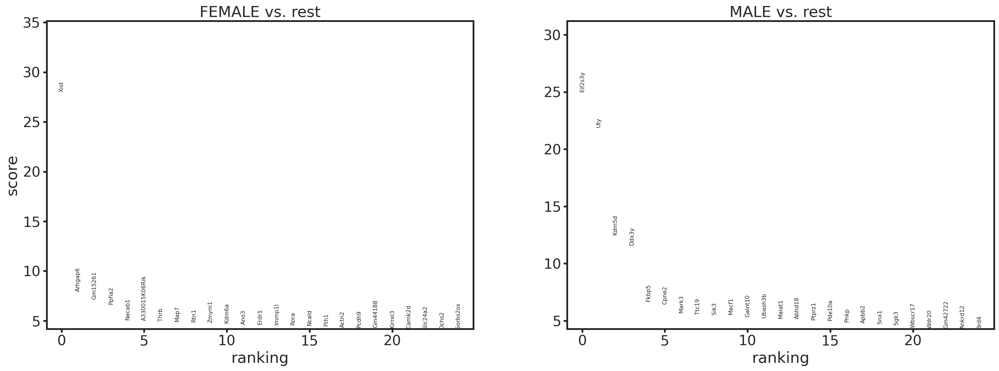

In [53]:
## classic uni-variate approach, global labels
sc.tl.rank_genes_groups(adata, 'sex', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [54]:
## multi-variate alternative DE test with logistic regression
##sc.tl.rank_genes_groups(adata, 'leiden', method='logreg')
##sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [55]:
result_glob = adata.uns['rank_genes_groups']
groups_glob = result_glob['names'].dtype.names
result_glob_df = pd.DataFrame(
    {group + '_' + key[:1]: result_glob[key][group]
    for group in groups_glob for key in ['names', 'pvals_adj', 'logfoldchanges']})

In [56]:
result_female_glob_df = result_glob_df[['FEMALE_n', 'FEMALE_p', 'FEMALE_l']]
result_male_glob_df = result_glob_df[['MALE_n', 'MALE_p', 'MALE_l']]
female_glob_DEs = result_female_glob_df.loc[result_female_glob_df['FEMALE_p']<0.01].loc[result_female_glob_df['FEMALE_l']>2]['FEMALE_n'].values
male_glob_DEs = result_male_glob_df.loc[result_male_glob_df['MALE_p']<0.01].loc[result_male_glob_df['MALE_l']>2]['MALE_n'].values
print(female_glob_DEs.shape, male_glob_DEs.shape, result_glob_df.shape)

(1,) (4,) (23426, 6)


In [57]:
print(female_glob_DEs)

['Xist']


In [58]:
print(male_glob_DEs)

['Eif2s3y' 'Uty' 'Kdm5d' 'Ddx3y']


In [59]:
'Srsf7' 
#'Eif2s3y' 
#'Uty' 
'Pgrmc1' 'Ckb' 
#'Tiparp' 
'Ei24' 
#'Kdm5d' 
'Borcs8''Chst1' 'Rpl8' 
#'Bmpr1b' 
'Mdh2' 
#'Ddx3y' 
'Gm10516' 'Ckmt1' 'Tkt' 'Actl6a'
 'Shisa4' 'Scyl2' 'Fam175b' 'Zfp112' 'Scn2b' 'Ptp4a1' '2300009A05Rik'
 'Tmem186' 'Eps15' 'Maea' 'Smyd5' 'Dap3' 'Bub3' 'Orai2' '2010300C02Rik'
 'Gm42984' 'AW209491' 'Hnrnpa0' 'Gpkow' 'Arfgap2' 'Cwc15' 'Ppp1r1a'
 'Sigmar1' 'Armcx1' 'Col8a1' '9330151L19Rik' 'Mrps17' 'Slc25a51' 'Hdhd2'
 'Tceal5' 'Park7' 'Supv3l1' 'Rpl7' 'Zswim3' 'Cnih1' 'Dynll2' 'Kcnh5'
 'Rap2b' 'Slc25a28' 'Atp6v1g1'

IndentationError: unexpected indent (<ipython-input-59-4b8a0dba7ad0>, line 13)

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


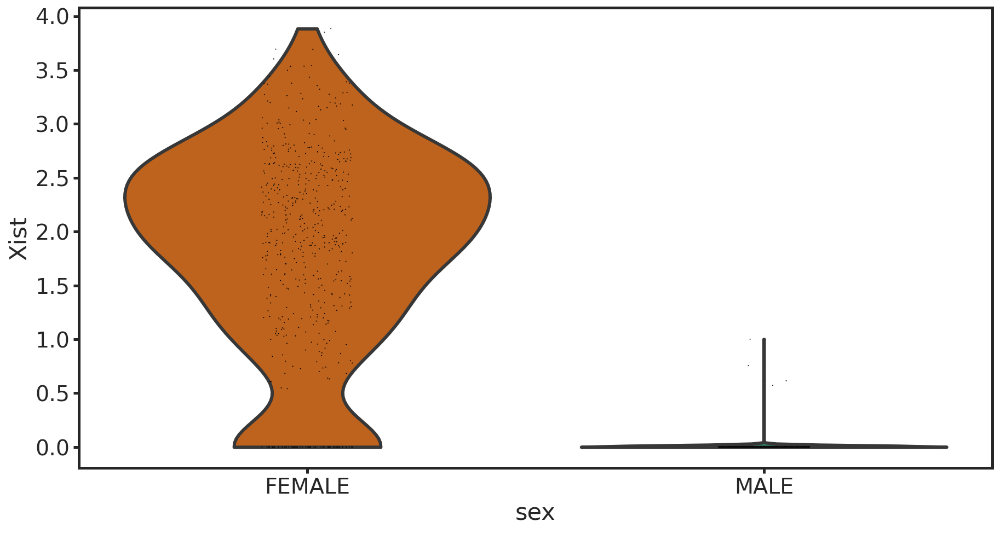

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: Futur

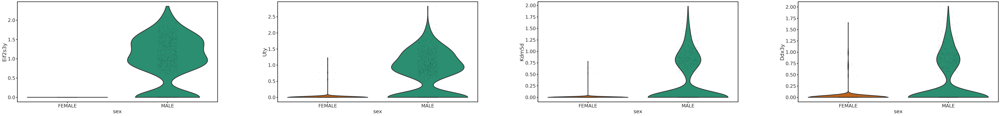

In [60]:
sc.pl.violin(adata=adata, keys=female_glob_DEs, groupby='sex', palette=["#D95F02", "#1B9E77"])
sc.pl.violin(adata=adata, keys=male_glob_DEs, groupby='sex', palette=["#D95F02", "#1B9E77"])

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


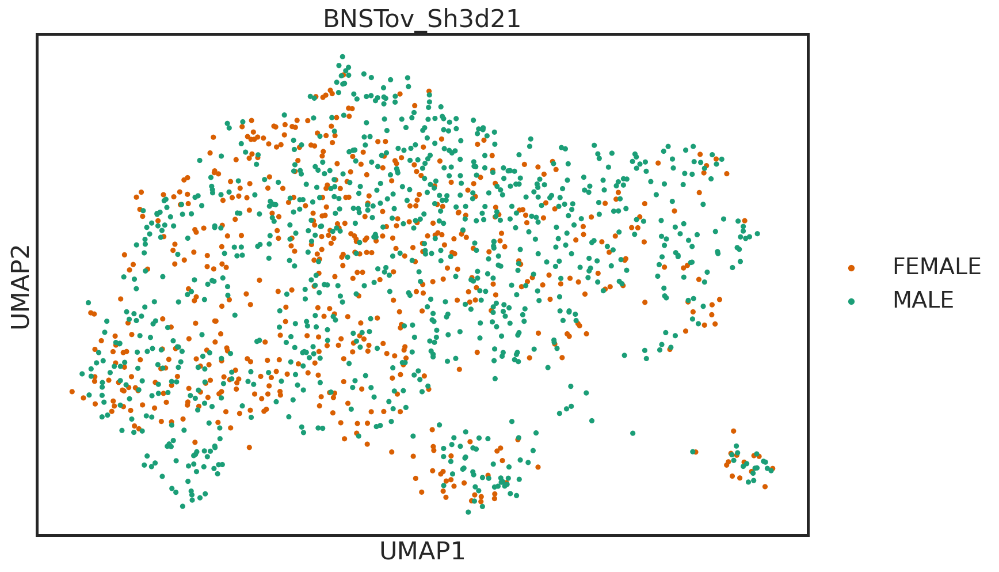

In [61]:
sc.pl.umap(adata, color='sex', palette=["#D95F02", "#1B9E77"], title=f'{PUCK_NUMBER}')

## Scale Data for PCA

In [62]:
scaler = StandardScaler()
scaled_log_normalized_expression_ng = scaler.fit_transform(log_normalized_expression_ng)

## Utility functions

In [63]:
def standalone_logistic(X, y):
    clf = LogisticRegression(random_state=RAND_SEED, penalty='none').fit(X, y)
    predicted_label = clf.predict(X)
    predicted_prob = clf.predict_proba(X)
    return predicted_prob[:,1]

def pca_logistic_kmeans(adata, num_pcs, PUCK_NUMBER=PUCK_NUMBER):
    
    output_path = f'latent_space_structure/plots/{PUCK_NUMBER}/'
    if not os.path.exists(output_path):
        os.mkdir(output_path)
    
    p_hat = standalone_logistic(adata.obsm['X_pca'][:, 0:num_pcs], sex)
    df_p_hat = pd.DataFrame()
    df_p_hat['p_hat'] = p_hat
    df_p_hat['sex'] = sex
    sns.histplot(x=p_hat, hue='sex', palette={'MALE':"#1B9E77", 'FEMALE':"#D95F02"}, data=df_p_hat)
    plt.title(f'p_hat, all cells, {num_pcs} PCs')
    plt.savefig(f'latent_space_structure/plots/{PUCK_NUMBER}/p_hat_pca{num_pcs}.png')
    plt.show()
    
    adata.obs['p_hat'] = p_hat
    sc.pl.umap(adata, color='p_hat')
    plt.savefig(f'latent_space_structure/plots/{PUCK_NUMBER}/umap_p_hat_pca{num_pcs}.png')
    plt.show()
    
    kmeans_female = KMeans(n_clusters=2, random_state=0).fit(pd.DataFrame(p_hat)[sex=='FEMALE'])
    kmeans_male = KMeans(n_clusters=2, random_state=0).fit(pd.DataFrame(p_hat)[sex=='MALE'])

    df = pd.DataFrame()
    df['sex'] = [int(x=='FEMALE') for x in adata.obs['sex']]#adata.obs['sex'].values.astype(int)
    
    if np.mean(p_hat[sex=='FEMALE']) < np.mean(p_hat[sex=='MALE']): 
        # then label female as 0
        df_p_hat_clust_male = df_p_hat.copy()
        df_p_hat_clust_male['kmeans'] = 'FEMALE'#0
        # then, when you cluster the male
        # low p_hat for the male should get mapped onto 0 ('FEMALE'-like)
        # high p_hat for the male should get mapped onto 1 ('MALE'-specific)
        zero_lab_has_lower_mean = np.mean(p_hat[sex=='MALE'][kmeans_male.labels_==0]) < np.mean(p_hat[sex=='MALE'][kmeans_male.labels_==1])
        df_p_hat_clust_male['kmeans'][sex=='MALE'] = ['MALE' if x==int(zero_lab_has_lower_mean) else 'FEMALE' for x in kmeans_male.labels_]
        #print(len(p_hat[sex=='MALE'][kmeans_male.labels_==1]), np.mean(p_hat[sex=='MALE'][kmeans_male.labels_==1]))
        #print(len(p_hat[sex=='MALE'][kmeans_male.labels_==0]), np.mean((p_hat[sex=='MALE'][kmeans_male.labels_==0])))
        np.save(f'latent_space_structure/data/{PUCK_NUMBER}/kmeans_logistic_pca{num_pcs}_cluster_male.npy', df_p_hat_clust_male['kmeans'].values)

        # then label female as 0
        df_p_hat_clust_female = df_p_hat.copy()
        df_p_hat_clust_female['kmeans'] = 'MALE'
        # then, when you cluster the female
        # low p_hat for the female should get mapped onto 0 ('FEMALE')
        # high p_hat for the female should get mapped onto 1 ('MALE'-like)
        zero_lab_has_lower_mean = np.mean(p_hat[sex=='FEMALE'][kmeans_female.labels_==0]) < np.mean(p_hat[sex=='FEMALE'][kmeans_female.labels_==1])
        df_p_hat_clust_female['kmeans'][sex=='FEMALE'] = ['MALE' if x==int(zero_lab_has_lower_mean) else 'FEMALE' for x in kmeans_female.labels_]
        np.save(f'latent_space_structure/data/{PUCK_NUMBER}/kmeans_logistic_pca{num_pcs}_cluster_female.npy', df_p_hat_clust_female['kmeans'].values)
        print('done!')
    else:
        # then label female as 1
        df_p_hat_clust_male = df_p_hat.copy()
        df_p_hat_clust_male['kmeans'] = 'FEMALE'#1
        # then, when you cluster the male
        # low p_hat for the male should get mapped onto 0 ('MALE')
        # high p_hat for the male should get mapped onto 1 ('FEMALE'-like)
        zero_lab_has_lower_mean = np.mean(p_hat[sex=='MALE'][kmeans_male.labels_==0]) < np.mean(p_hat[sex=='MALE'][kmeans_male.labels_==1])
        df_p_hat_clust_male['kmeans'][sex=='MALE'] = ['FEMALE' if x==int(zero_lab_has_lower_mean) else 'MALE' for x in kmeans_male.labels_]
        #print(len(p_hat[sex=='MALE'][kmeans_male.labels_==1]), np.mean(p_hat[sex=='MALE'][kmeans_male.labels_==1]))
        #print(len(p_hat[sex=='MALE'][kmeans_male.labels_==0]), np.mean((p_hat[sex=='MALE'][kmeans_male.labels_==0])))
        np.save(f'latent_space_structure/data/{PUCK_NUMBER}/kmeans_logistic_pca{num_pcs}_cluster_male.npy', df_p_hat_clust_male['kmeans'].values)

        # then label female as 0
        df_p_hat_clust_female = df_p_hat.copy()
        df_p_hat_clust_female['kmeans'] = 'MALE'
        # then, when you cluster the female
        # low p_hat for the female should get mapped onto 0 ('MALE'-like)
        # high p_hat for the female should get mapped onto 1 ('FEMALE'-specific)
        zero_lab_has_lower_mean = np.mean(p_hat[sex=='FEMALE'][kmeans_female.labels_==0]) < np.mean(p_hat[sex=='FEMALE'][kmeans_female.labels_==1])
        df_p_hat_clust_female['kmeans'][sex=='FEMALE'] = ['FEMALE' if x==int(zero_lab_has_lower_mean) else 'MALE' for x in kmeans_female.labels_]
        np.save(f'latent_space_structure/data/{PUCK_NUMBER}/kmeans_logistic_pca{num_pcs}_cluster_female.npy', df_p_hat_clust_female['kmeans'].values)
        print('done!')
        
    adata.obs['p_hat_clust_male'] = df_p_hat_clust_male['kmeans'].values
    sc.pl.umap(adata, color='p_hat_clust_male')
    plt.savefig(f'latent_space_structure/plots/{PUCK_NUMBER}/umap_p_hat_clust_male_pca{num_pcs}.png')
    plt.show()
    adata.obs['p_hat_clust_female'] = df_p_hat_clust_female['kmeans'].values
    sc.pl.umap(adata, color='p_hat_clust_female')
    plt.savefig(f'latent_space_structure/plots/{PUCK_NUMBER}/umap_p_hat_clust_female_pca{num_pcs}.png')
    plt.show()

    #sc.pl.violin(adata=adata, keys='p_hat_clust_male', groupby='sex')
    #plt.savefig(f'latent_space_structure/plots/{PUCK_NUMBER}/violin_p_hat_pca{num_pcs}.png')
    #plt.show()

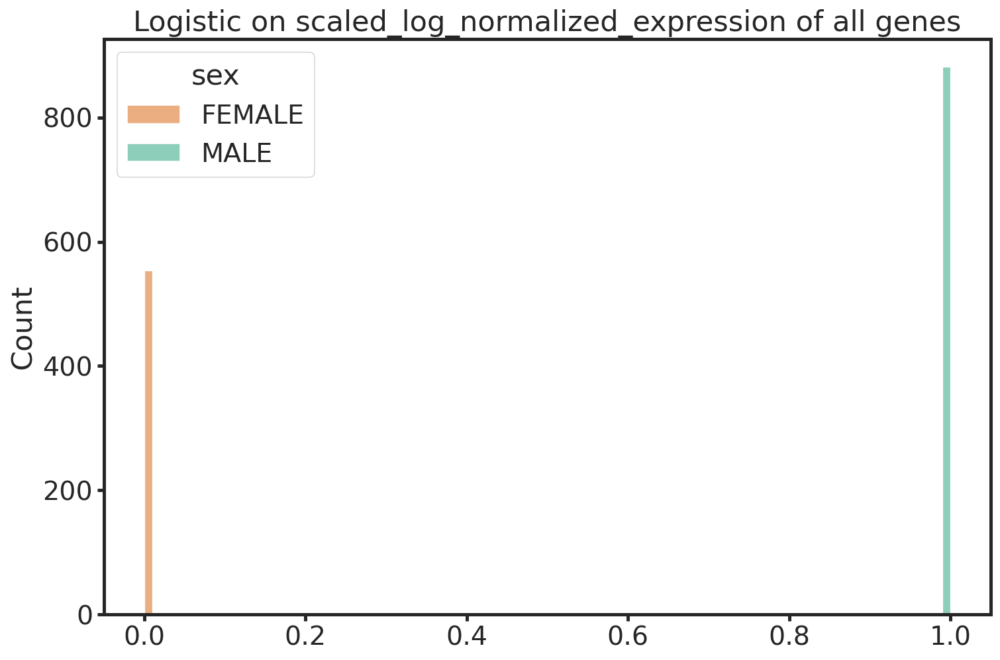

In [64]:
p_hat = standalone_logistic(scaled_log_normalized_expression_ng, #log_normalized_expression_ng
                            adata.obs['sex'])
df_p_hat = pd.DataFrame()
df_p_hat['p_hat'] = p_hat
df_p_hat['sex'] = sex

sns.histplot(x=p_hat, bins=100, hue='sex', palette={'MALE':"#1B9E77", "FEMALE":"#D95F02"}, data=df_p_hat)
plt.title('Logistic on scaled_log_normalized_expression of all genes')
plt.show()

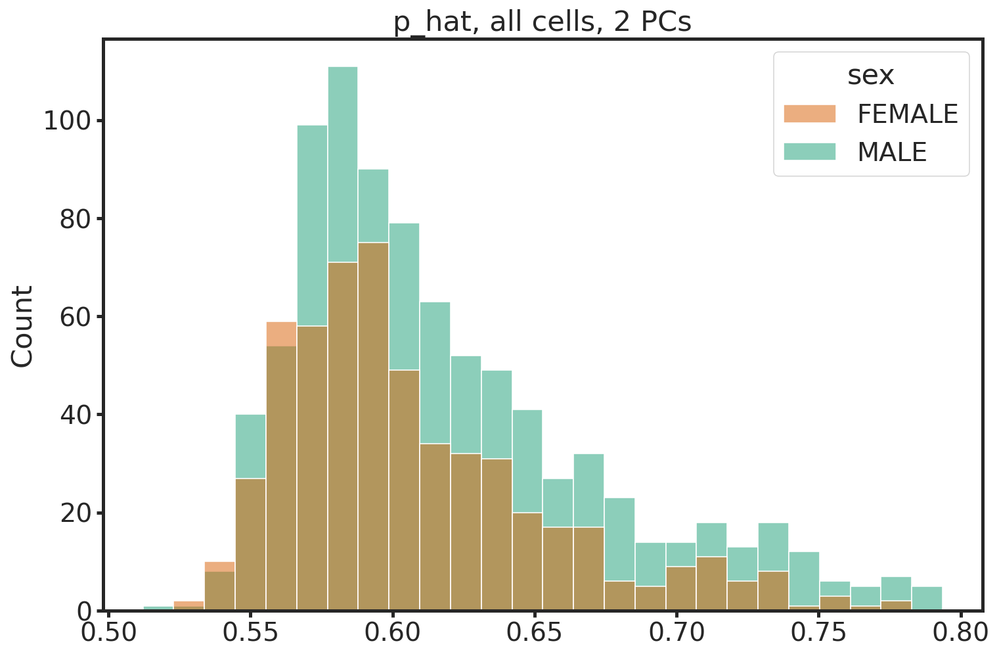

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


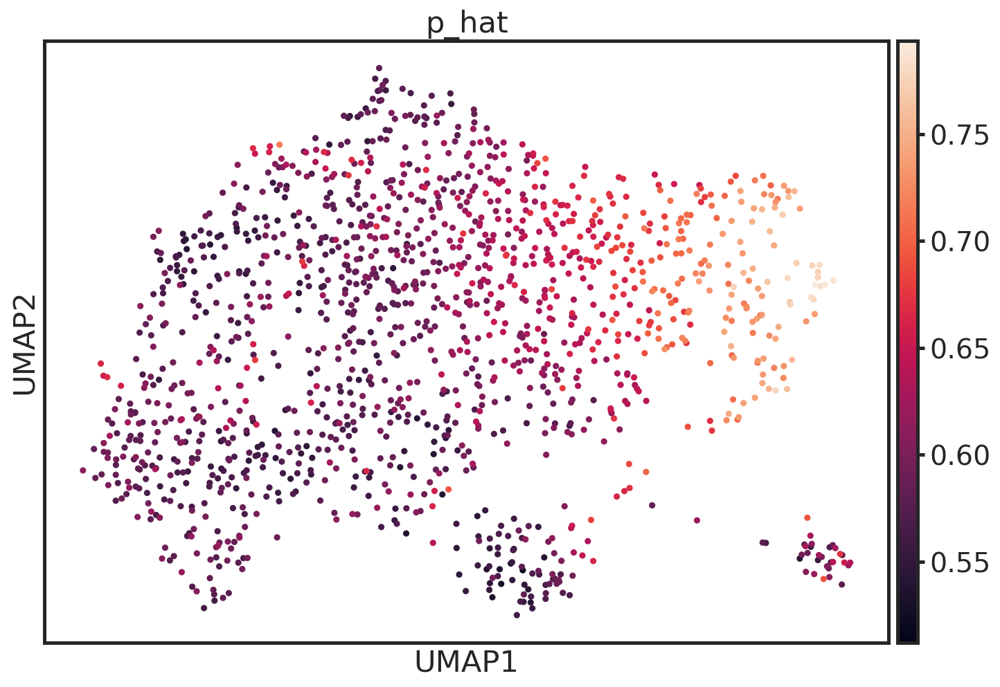

<Figure size 864x576 with 0 Axes>

<ipython-input-63-e5476a7296fa>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat_clust_male['kmeans'][sex=='MALE'] = ['MALE' if x==int(zero_lab_has_lower_mean) else 'FEMALE' for x in kmeans_male.labels_]
<ipython-input-63-e5476a7296fa>:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat_clust_female['kmeans'][sex=='FEMALE'] = ['MALE' if x==int(zero_lab_has_lower_mean) else 'FEMALE' for x in kmeans_female.labels_]
/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype i

done!


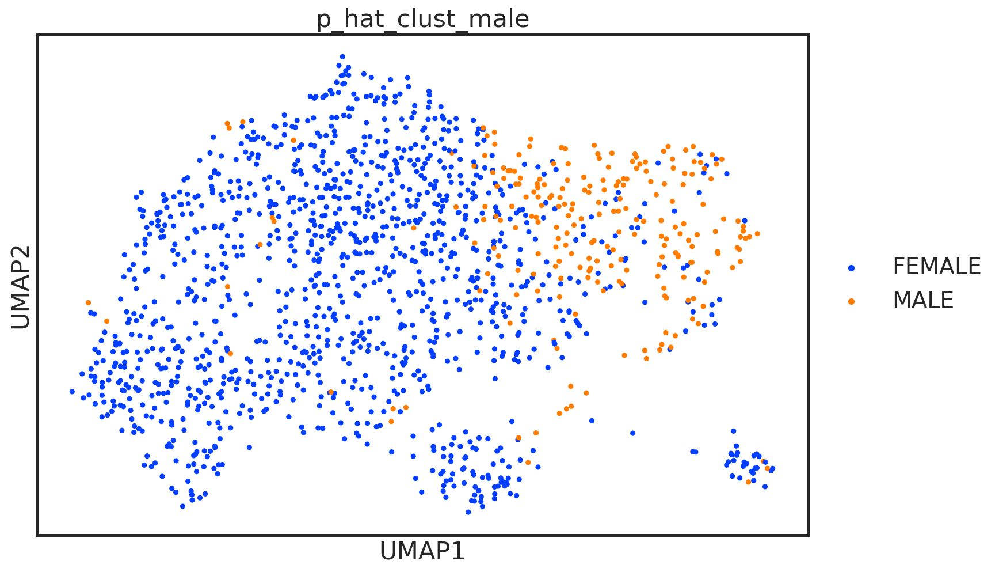

<Figure size 864x576 with 0 Axes>

... storing 'p_hat_clust_female' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


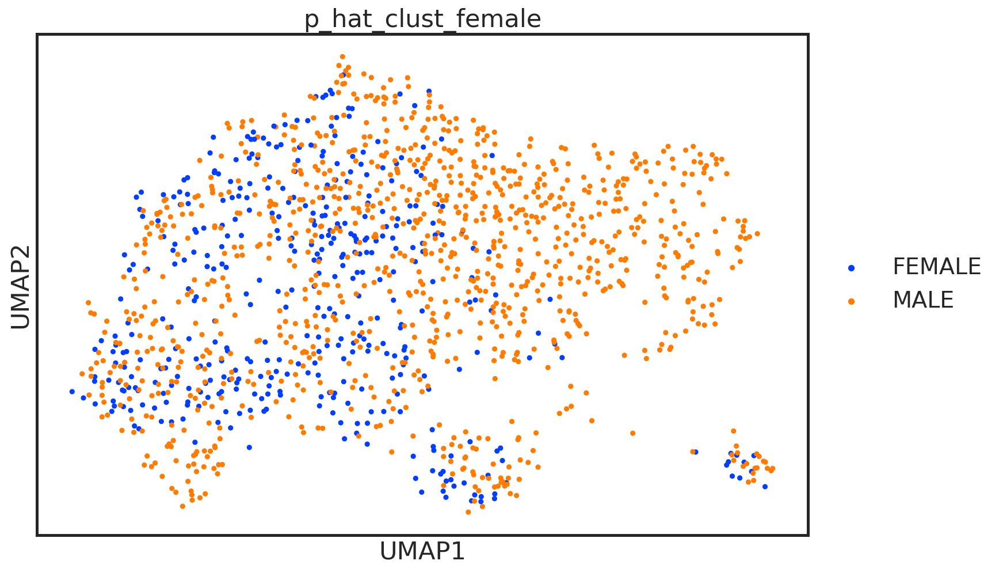

<Figure size 864x576 with 0 Axes>

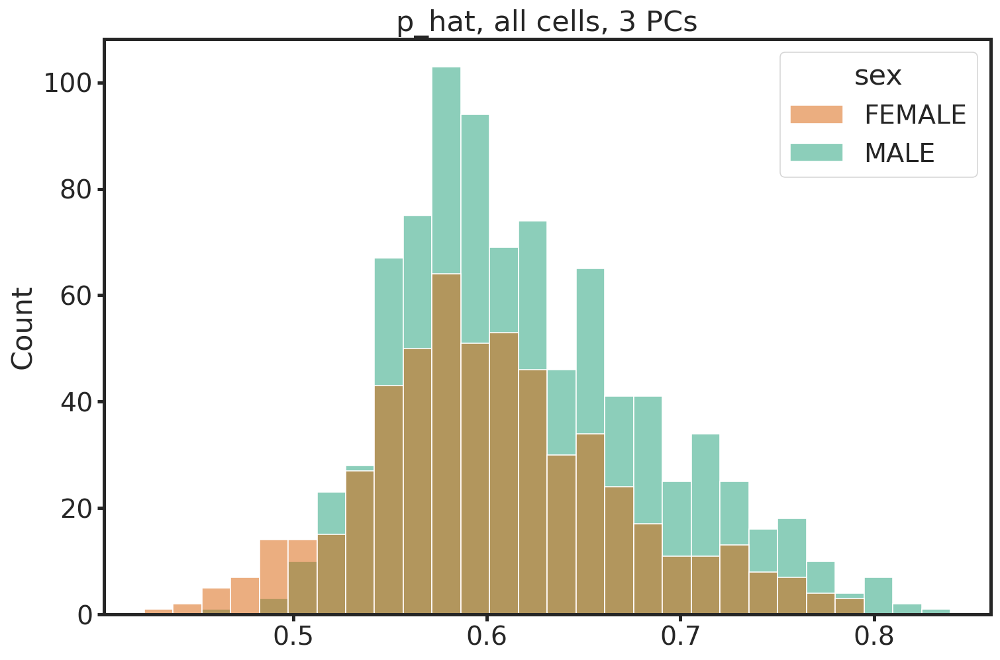

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


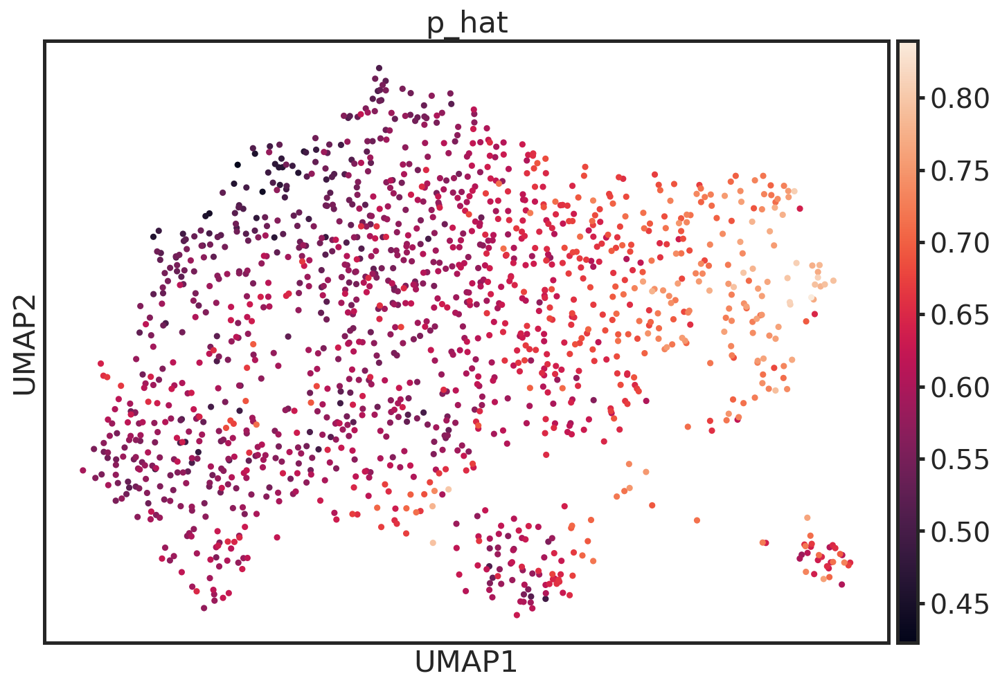

<Figure size 864x576 with 0 Axes>

<ipython-input-63-e5476a7296fa>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat_clust_male['kmeans'][sex=='MALE'] = ['MALE' if x==int(zero_lab_has_lower_mean) else 'FEMALE' for x in kmeans_male.labels_]
<ipython-input-63-e5476a7296fa>:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat_clust_female['kmeans'][sex=='FEMALE'] = ['MALE' if x==int(zero_lab_has_lower_mean) else 'FEMALE' for x in kmeans_female.labels_]
/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype i

done!


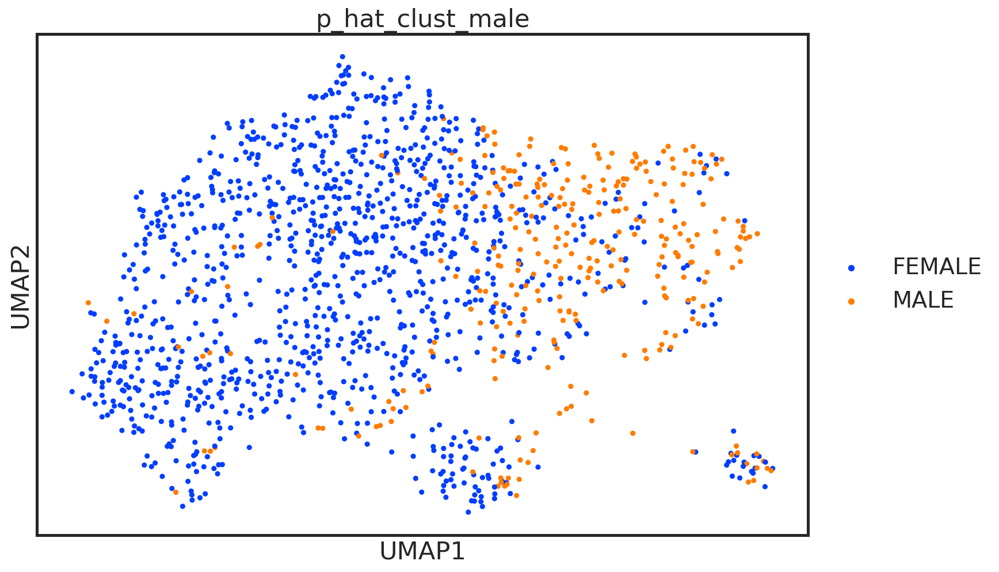

<Figure size 864x576 with 0 Axes>

... storing 'p_hat_clust_female' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


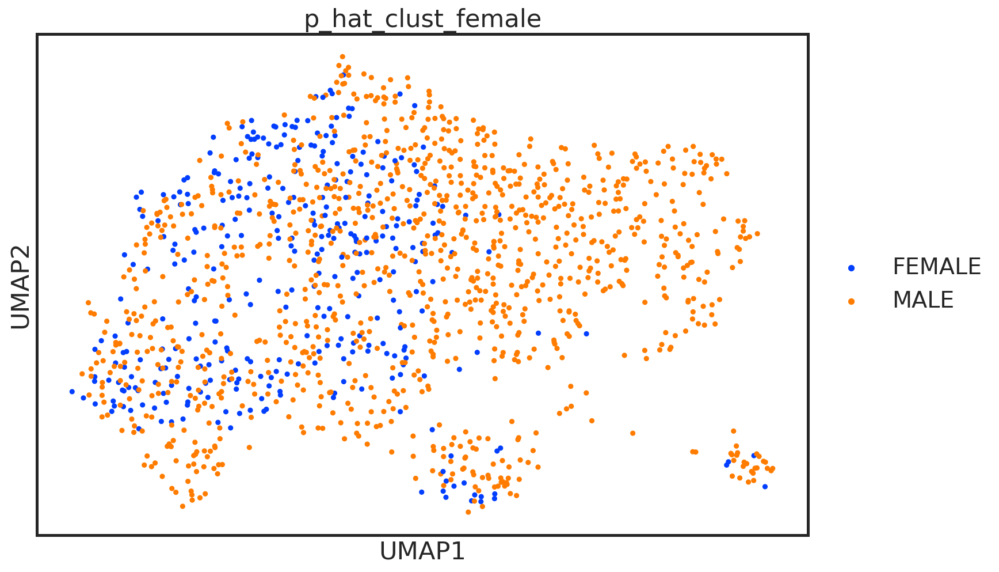

<Figure size 864x576 with 0 Axes>

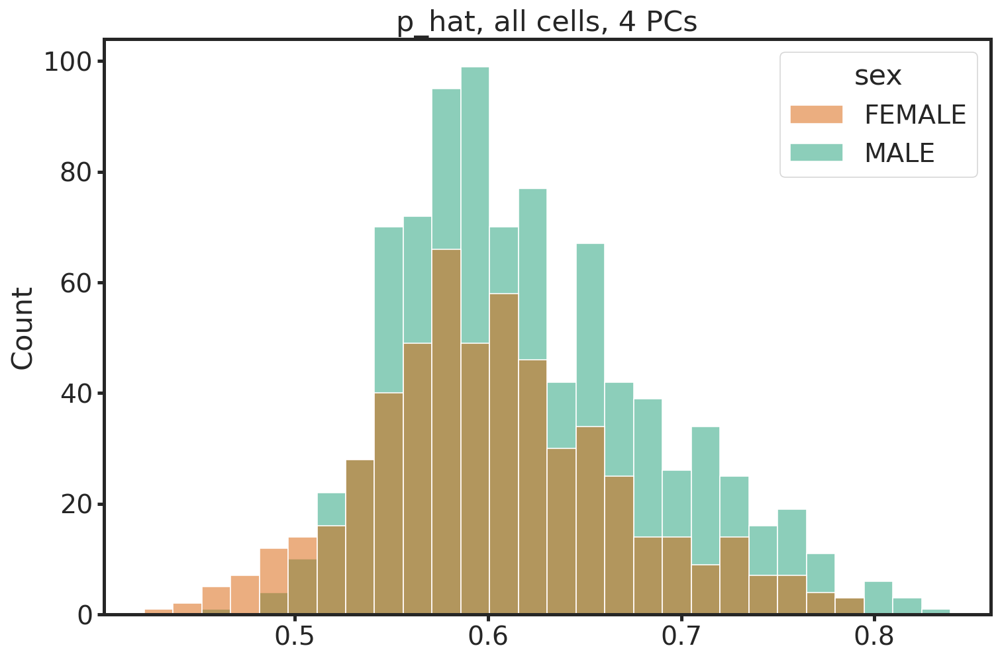

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


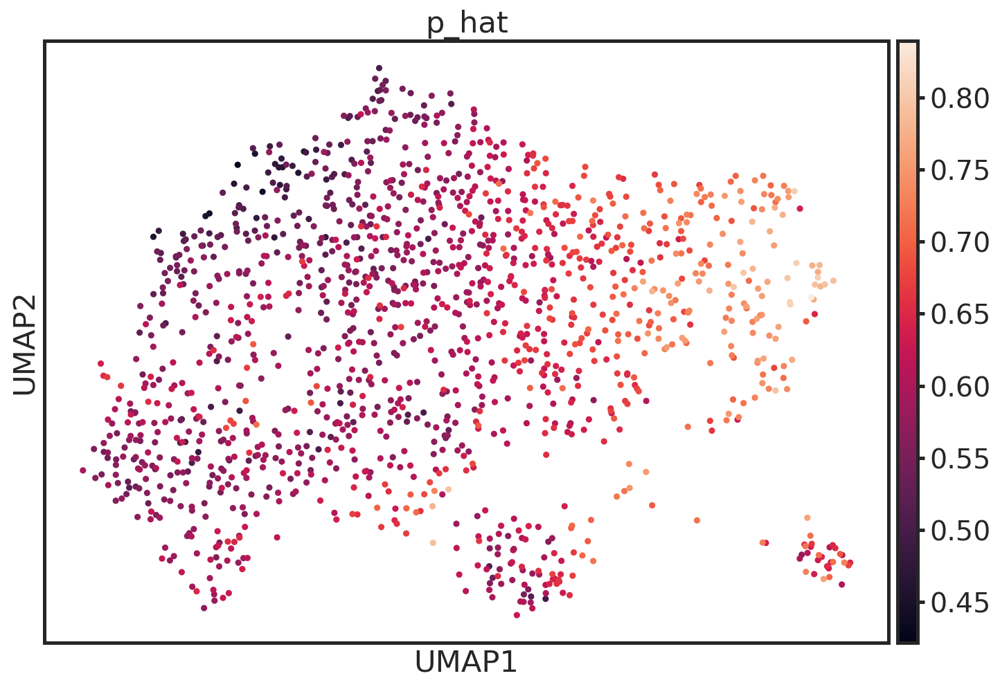

<Figure size 864x576 with 0 Axes>

<ipython-input-63-e5476a7296fa>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat_clust_male['kmeans'][sex=='MALE'] = ['MALE' if x==int(zero_lab_has_lower_mean) else 'FEMALE' for x in kmeans_male.labels_]
<ipython-input-63-e5476a7296fa>:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat_clust_female['kmeans'][sex=='FEMALE'] = ['MALE' if x==int(zero_lab_has_lower_mean) else 'FEMALE' for x in kmeans_female.labels_]
/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype i

done!


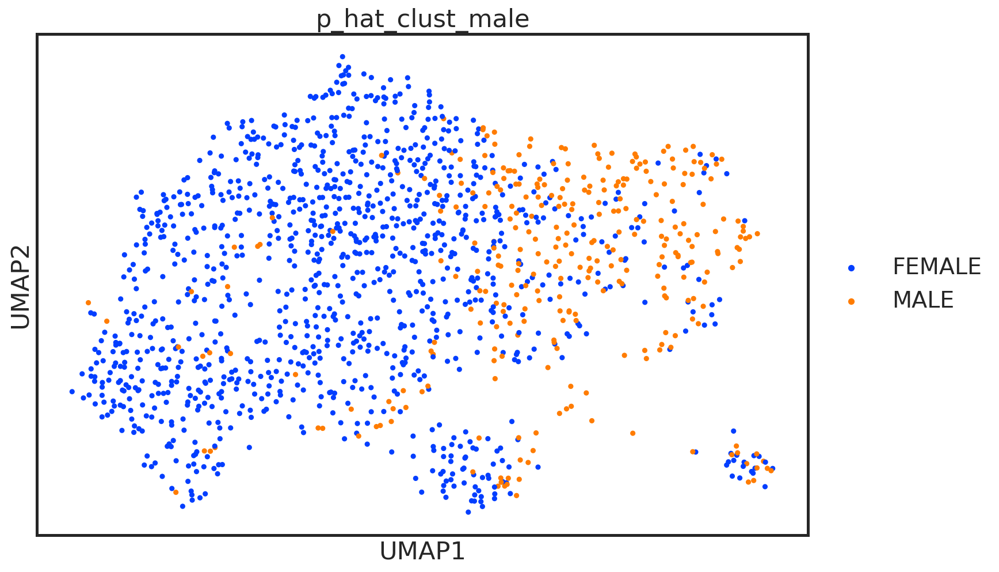

<Figure size 864x576 with 0 Axes>

... storing 'p_hat_clust_female' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


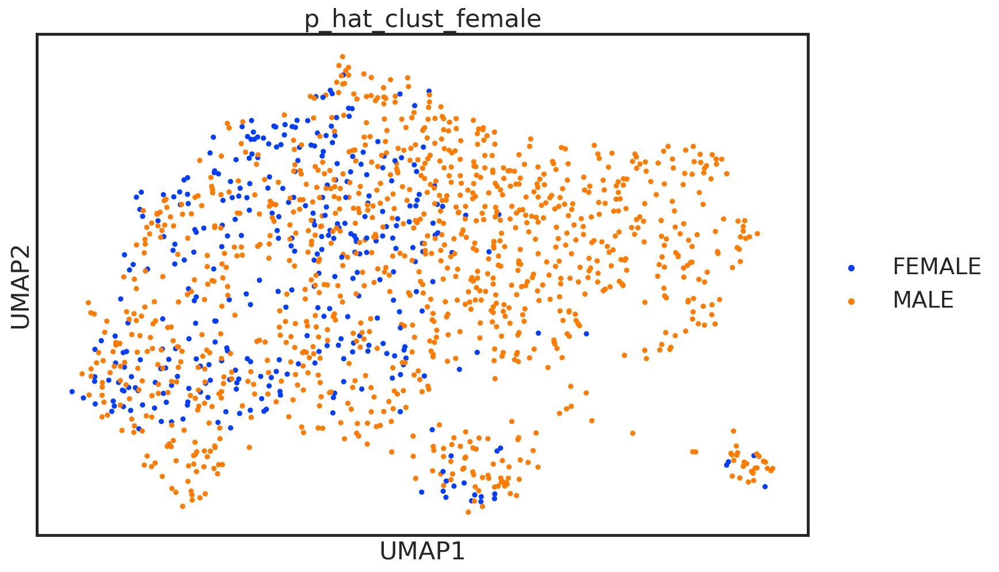

<Figure size 864x576 with 0 Axes>

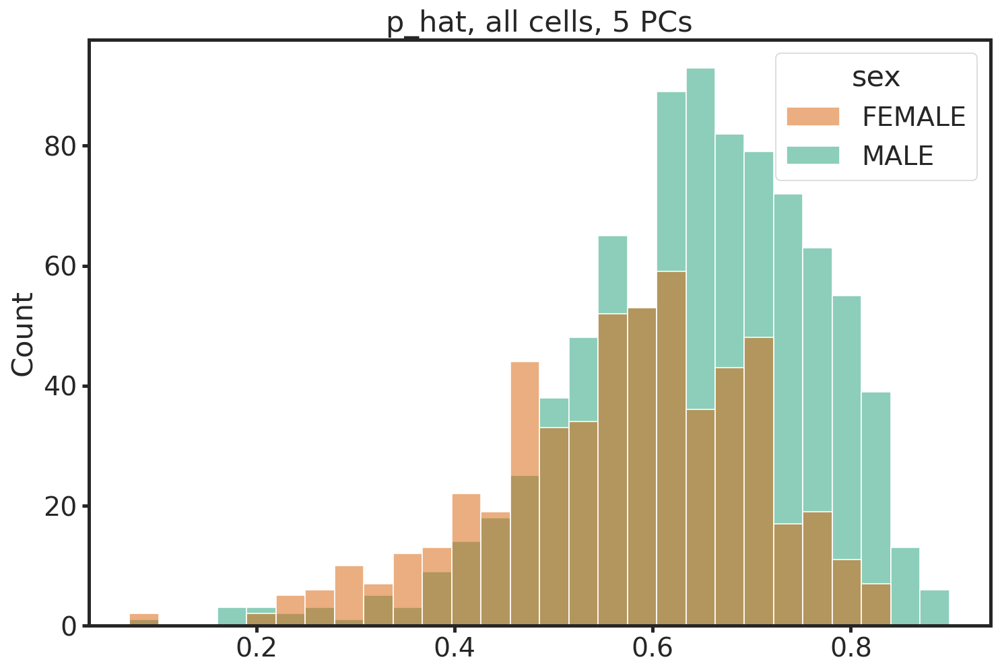

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


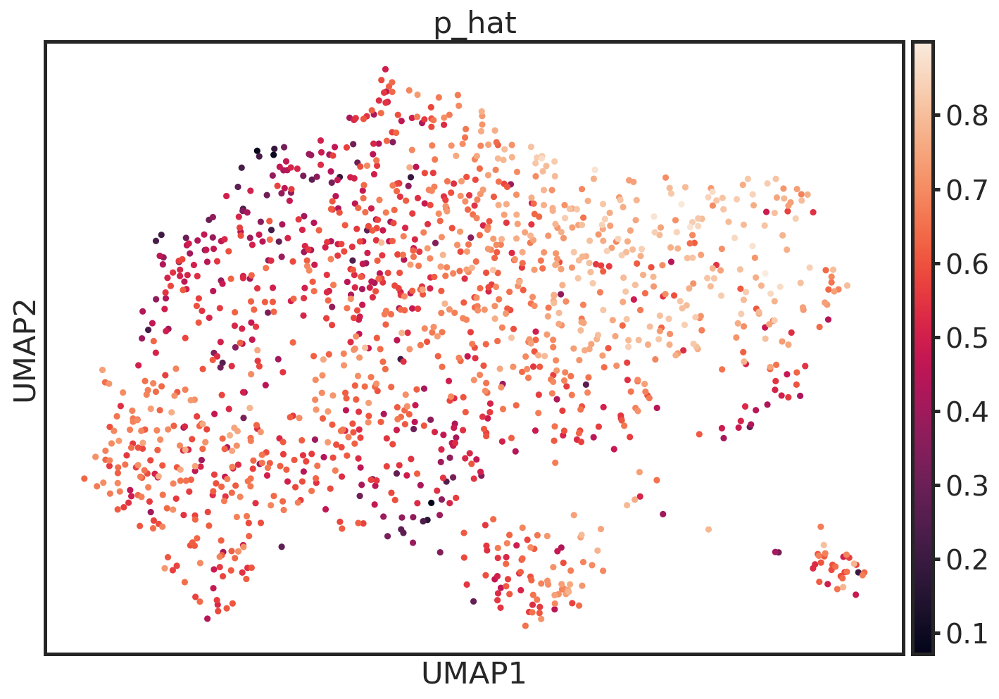

<Figure size 864x576 with 0 Axes>

<ipython-input-63-e5476a7296fa>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat_clust_male['kmeans'][sex=='MALE'] = ['MALE' if x==int(zero_lab_has_lower_mean) else 'FEMALE' for x in kmeans_male.labels_]
<ipython-input-63-e5476a7296fa>:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat_clust_female['kmeans'][sex=='FEMALE'] = ['MALE' if x==int(zero_lab_has_lower_mean) else 'FEMALE' for x in kmeans_female.labels_]
/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype i

done!


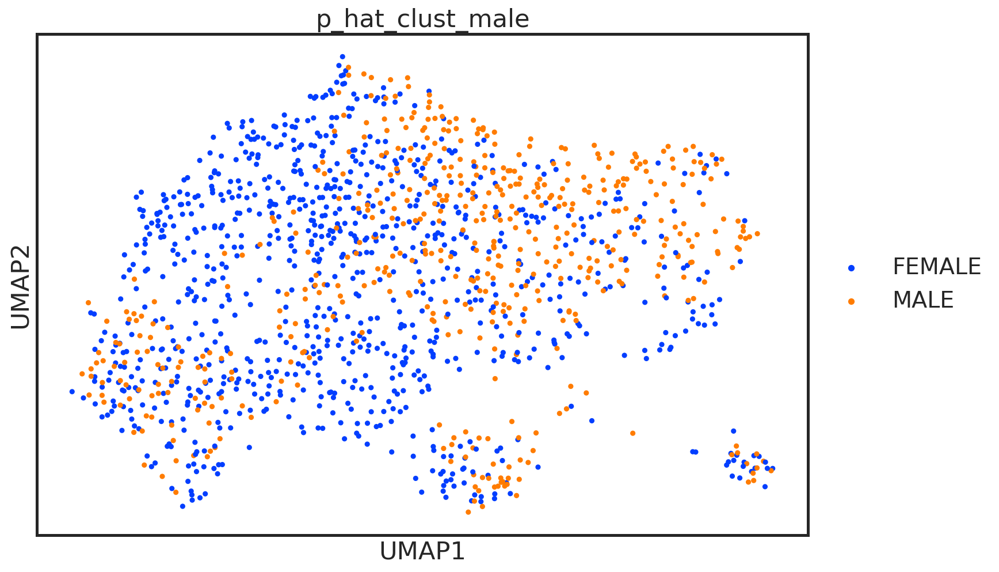

<Figure size 864x576 with 0 Axes>

... storing 'p_hat_clust_female' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


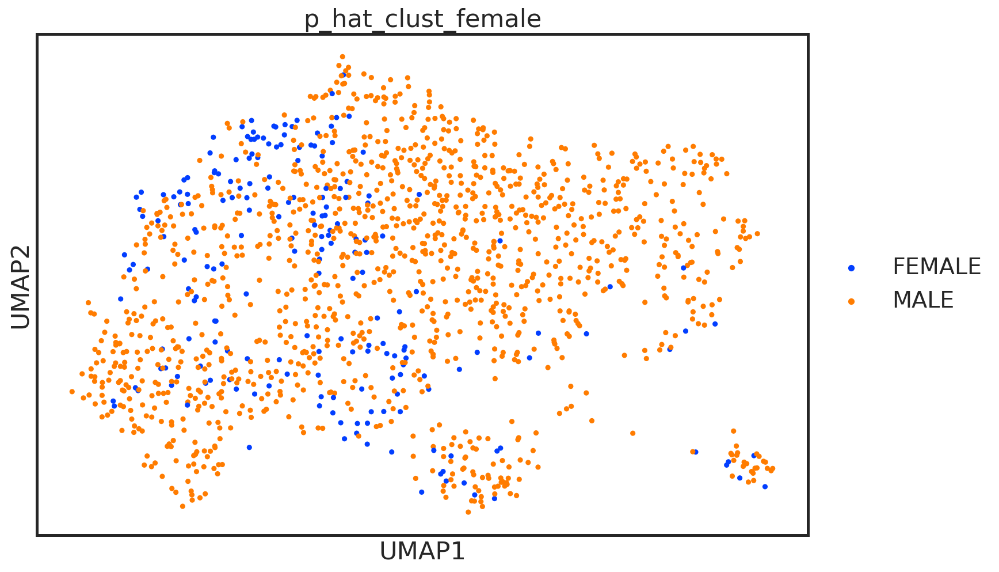

<Figure size 864x576 with 0 Axes>

In [65]:
for num_pcs in range(2, 6):
    pca_logistic_kmeans(adata, num_pcs)

In [346]:
## baseline0: seurat cluster all cells into two clusters
#adata.obs['baseline0'] = seurat_labs.astype('str')

## classic uni-variate approach, global labels
#sc.tl.rank_genes_groups(adata, 'baseline0', method='wilcoxon')
#sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

#result_baseline0 = adata.uns['rank_genes_groups']
#groups_baseline0 = result_glob['names'].dtype.names
#result_baseline0_df = pd.DataFrame(
#    {group + '_' + key[:1]: result_baseline0[key][group]
#    for group in groups_baseline0 for key in ['names', 'pvals_adj', 'logfoldchanges']})
#result_1_baseline0_df = result_baseline0_df[['1_n', '1_p', '1_l']]
#result_0_baseline0_df = result_baseline0_df[['0_n', '0_p', '0_l']]
#lab0_baseline0_DEs = result_0_baseline0_df.loc[result_0_baseline0_df['0_p']<0.01].loc[result_0_baseline0_df['0_l']>0.25]['0_n'].values
#lab1_baseline0_DEs = result_1_baseline0_df.loc[result_1_baseline0_df['1_p']<0.01].loc[result_1_baseline0_df['1_l']>0.25]['1_n'].values
#print(lab0_baseline0_DEs.shape, lab1_baseline0_DEs.shape, result_baseline0_df.shape)

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'kmeans_p_hat_2pcs' as categorical


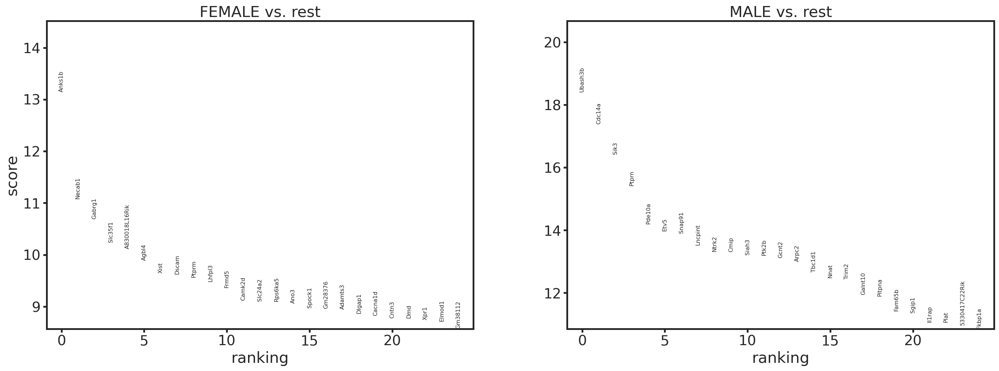

(13,) (13,) (23426, 6)
['Xist' 'Prr16' 'Ptchd4' 'Serpini1' 'Gm30382' 'Elavl4' 'Hs3st4' 'Ildr2'
 'Glra2' 'Cdh7' 'Oprd1' 'Elavl2' 'Phactr2']
['Ubash3b' 'Cdc14a' 'Siah3' 'Plat' 'Fam107b' 'Taf13' 'Per1' 'Hcrtr2' 'Fos'
 'Arl5b' 'Hs3st2' 'Sik1' 'Arc']


/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


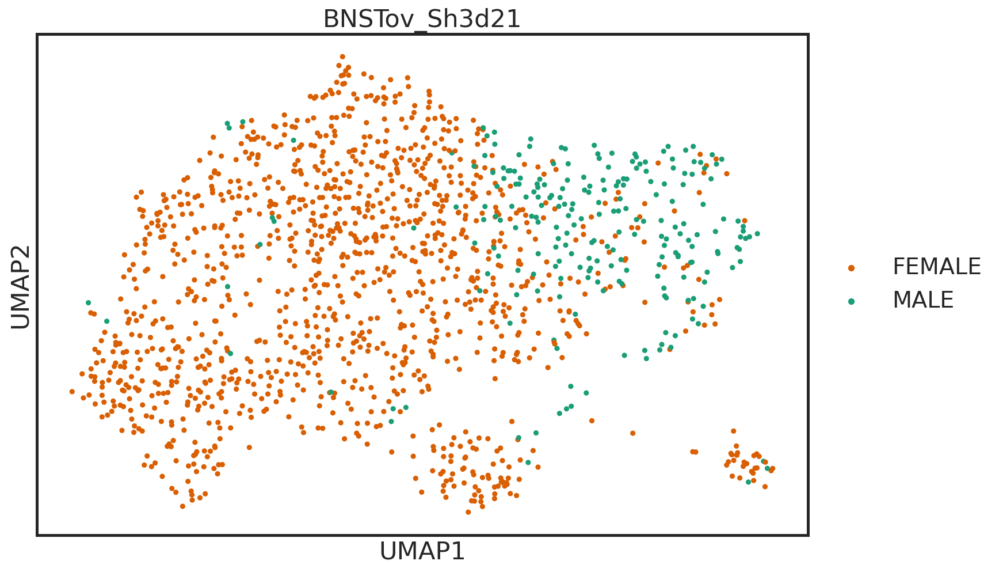

/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/en

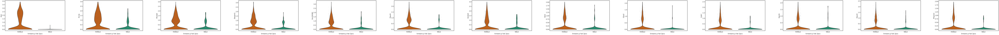

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: Futur

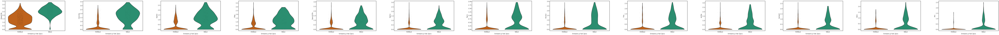

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'kmeans_p_hat_3pcs' as categorical


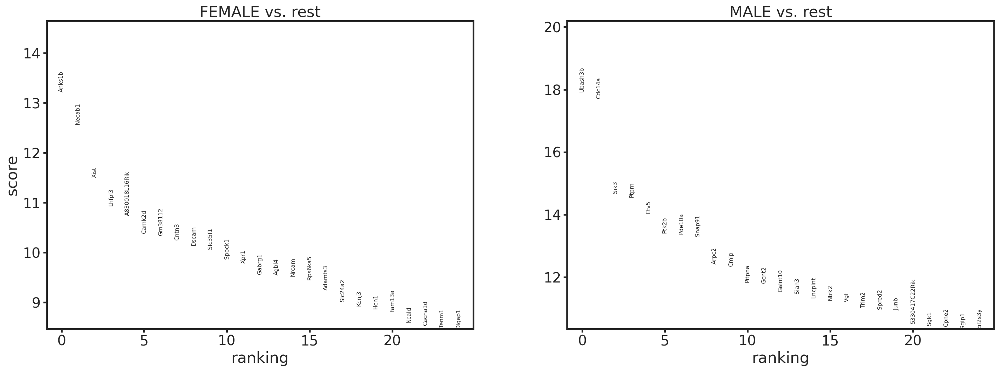

(1,) (5,) (23426, 6)
['Xist']
['Cdc14a' 'Hcrtr2' 'Hs3st2' 'Midn' 'Arc']


/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


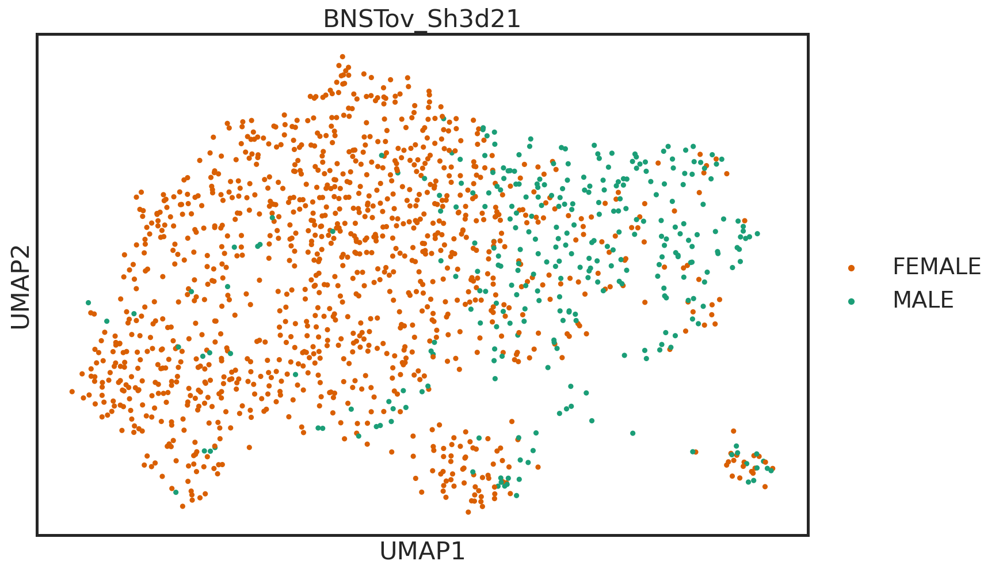

/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


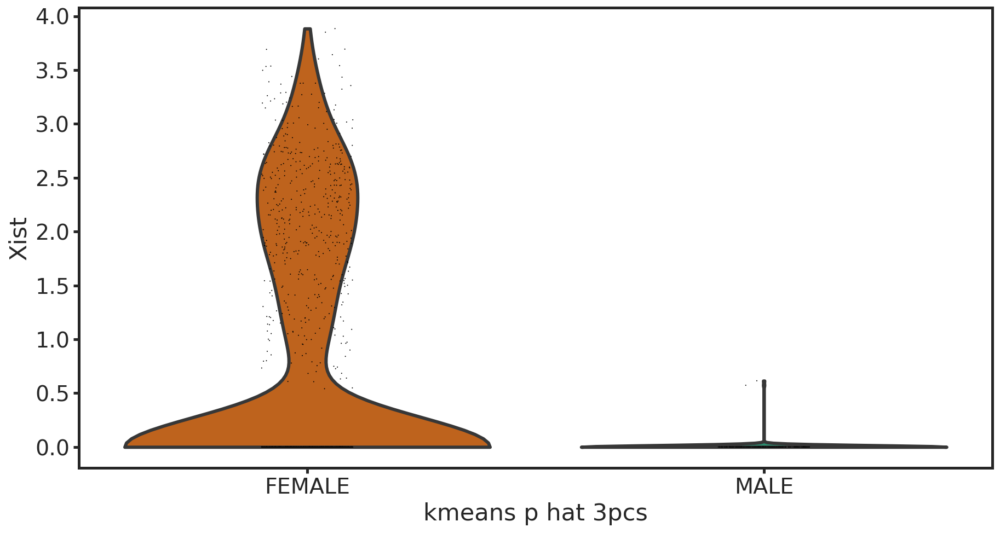

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: Futur

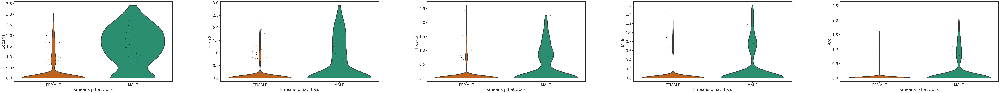

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'kmeans_p_hat_4pcs' as categorical


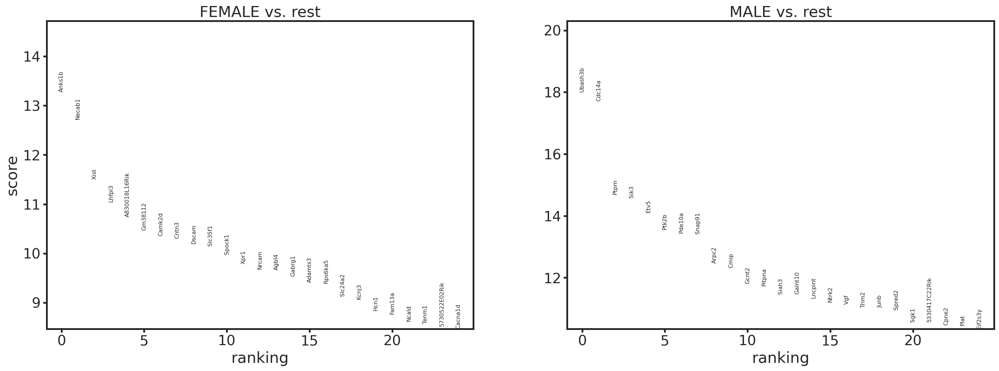

(2,) (6,) (23426, 6)
['Xist' 'Oprd1']
['Cdc14a' 'Hcrtr2' 'Hs3st2' 'Midn' 'Arc' 'Grm4']


/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


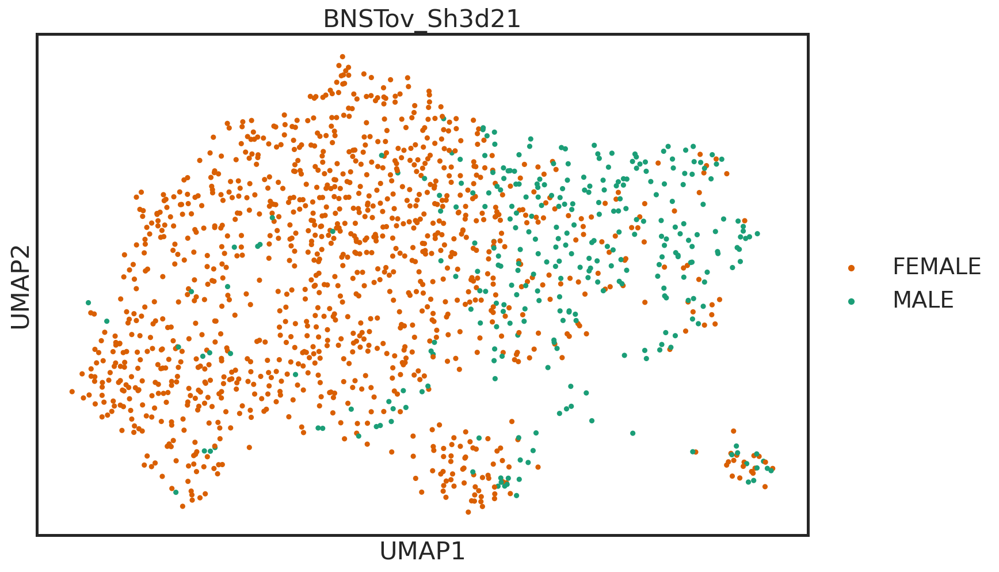

/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/en

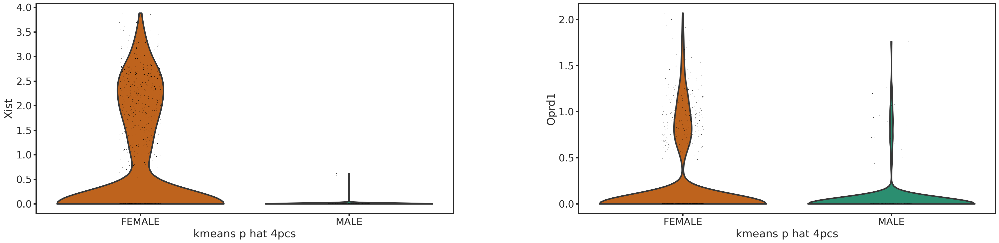

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: Futur

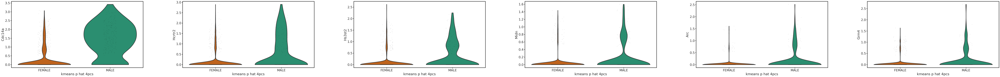

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'kmeans_p_hat_5pcs' as categorical


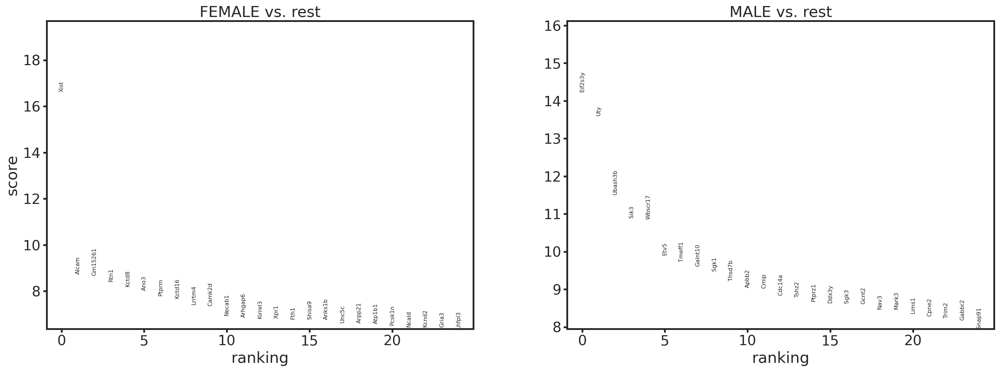

(1,) (1,) (23426, 6)
['Xist']
['Hcrtr2']


/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


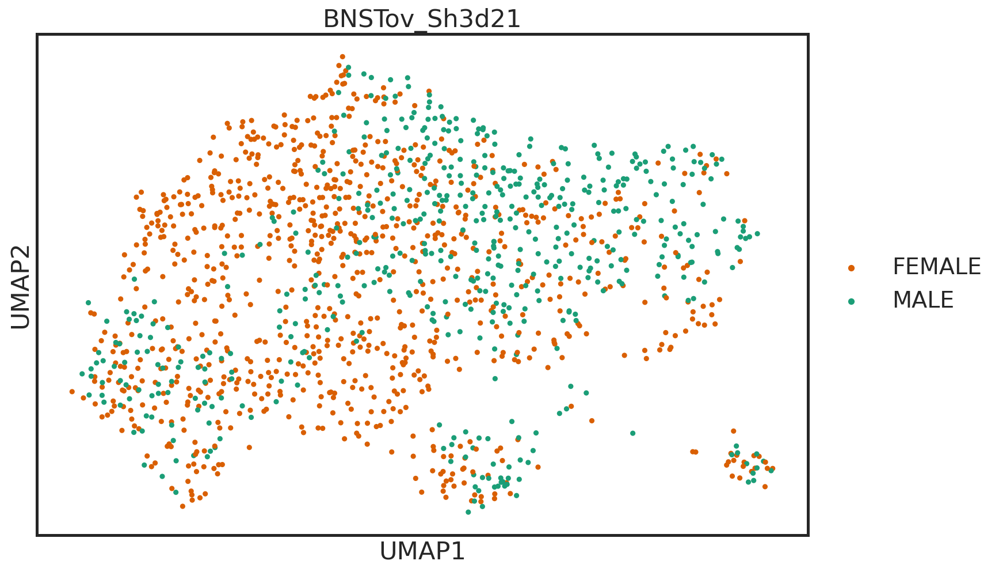

/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


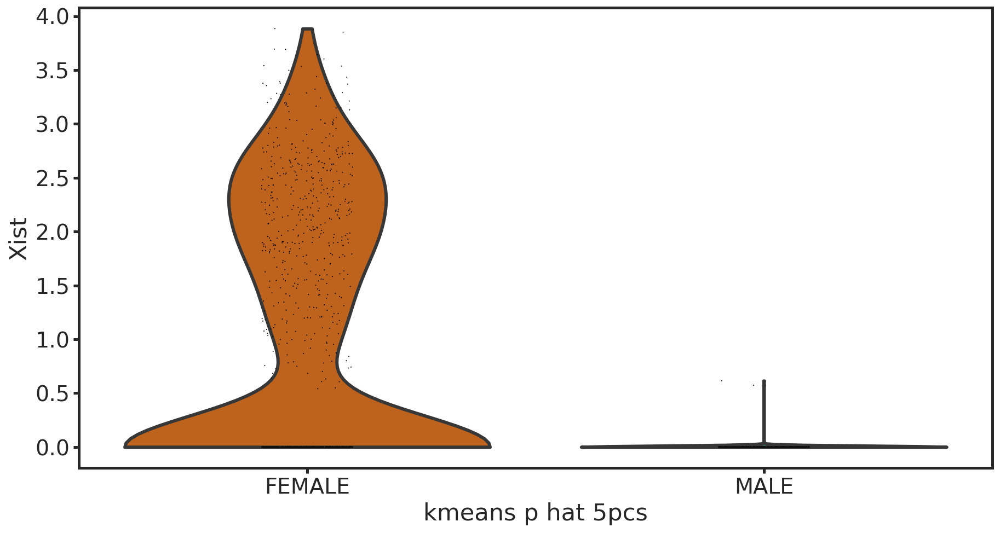

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


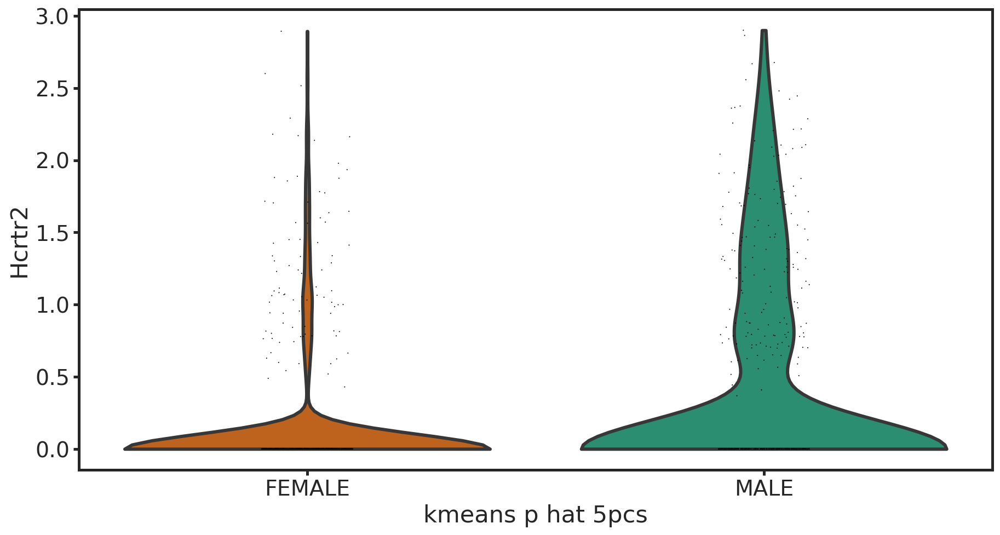

In [68]:
# method1: kmeans on p_hat for case cells from logistic on pca
# num pcs ablation
# check which of cluster_male or cluster_female makes sense # not both
for num_pcs in range(2, 6):
    labs = np.load(f'latent_space_structure/data/{PUCK_NUMBER}/kmeans_logistic_pca{num_pcs}_cluster_female.npy')
    adata.obs[f'kmeans_p_hat_{num_pcs}pcs'] = labs.astype('str')

    sc.tl.rank_genes_groups(adata, f'kmeans_p_hat_{num_pcs}pcs', method='wilcoxon')
    sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

    result = adata.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    result_df = pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
    result_female_df = result_df[['FEMALE_n', 'FEMALE_p', 'FEMALE_l']]
    result_male_df = result_df[['MALE_n', 'MALE_p', 'MALE_l']]
    female_DEs = result_female_df.loc[result_female_df['FEMALE_p']<0.01].loc[result_female_df['FEMALE_l']>2]['FEMALE_n'].values
    male_DEs = result_male_df.loc[result_male_df['MALE_p']<0.01].loc[result_male_df['MALE_l']>2]['MALE_n'].values
    print(female_DEs.shape, male_DEs.shape, result_df.shape)
    print(female_DEs)
    print(male_DEs)
    sc.pl.umap(adata, color=f'kmeans_p_hat_{num_pcs}pcs', palette=["#D95F02", "#1B9E77"], title=f'{PUCK_NUMBER}')
    sc.pl.violin(adata=adata, keys=female_DEs, groupby=f'kmeans_p_hat_{num_pcs}pcs', palette=["#D95F02", "#1B9E77"])
    sc.pl.violin(adata=adata, keys=male_DEs, groupby=f'kmeans_p_hat_{num_pcs}pcs', palette=["#D95F02", "#1B9E77"])

#    ## Save method1 results
#    fname = f'latent_space_structure/data/{PUCK_NUMBER}/DE_method1_results_{num_pcs}pcs.npz'
#    adict = {'memory_DEs':memory_DEs, 
#             'naive_DEs':naive_DEs,
#             'control_DEs':control_DEs,
#             'case_DEs':case_DEs}
#    np.savez_compressed(fname, **adict)
#    print(f'done {num_pcs}')
#    #adict


In [ ]:
labs = np.load(f'latent_space_structure/data/{PUCK_NUMBER}/kmeans_logistic_pca.npy')

In [ ]:
labs

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'baseline1' as categorical


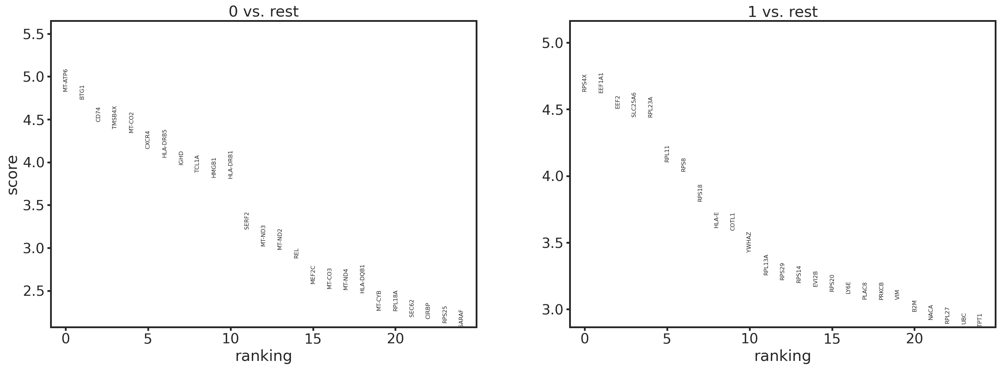

(0,) (0,) (17009, 6)


In [952]:
# baseline1: kmeans on p_hat for case from logistic on pca
labs = np.load(f'latent_space_structure/data/{PUCK_NUMBER}/kmeans_logistic_pca.npy')
adata.obs['baseline1'] = labs.astype('str')

# classic uni-variate approach, global labels
sc.tl.rank_genes_groups(adata, 'baseline1', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

result_baseline1 = adata.uns['rank_genes_groups']
groups_baseline1 = result_glob['names'].dtype.names
result_baseline1_df = pd.DataFrame(
    {group + '_' + key[:1]: result_baseline1[key][group]
    for group in groups_baseline1 for key in ['names', 'pvals_adj', 'logfoldchanges']})
result_case_baseline1_df = result_baseline1_df[['1_n', '1_p', '1_l']]
result_control_baseline1_df = result_baseline1_df[['0_n', '0_p', '0_l']]
control_baseline1_DEs = result_control_baseline1_df.loc[result_control_baseline1_df['0_p']<0.01].loc[result_control_baseline1_df['0_l']>0.25]['0_n'].values
case_baseline1_DEs = result_case_baseline1_df.loc[result_case_baseline1_df['1_p']<0.01].loc[result_case_baseline1_df['1_l']>0.25]['1_n'].values
print(control_baseline1_DEs.shape, case_baseline1_DEs.shape, result_baseline1_df.shape)

## Save DEs

In [953]:
#fname = f'latent_space_structure/data/{PUCK_NUMBER}/DE_results.npz'
#adict = {'memory_DEs':memory_DEs, 
#         'naive_DEs':naive_DEs,
#         'control_DEs':control_glob_DEs,
#         'case_DEs':case_glob_DEs,
#         'naiveB_control_DEs':naiveB_0_DEs,
#         'naiveB_case_DEs':naiveB_1_DEs}
#np.savez_compressed(fname, **adict)
##np.savez_compressed(fname, memory_DEs=memory_DEs, naive_DEs=naive_DEs)

## Save baseline0

In [954]:
fname = f'latent_space_structure/data/{PUCK_NUMBER}/DE_baseline0_results.npz'
adict = {'memory_DEs':memory_DEs, 
         'naive_DEs':naive_DEs,
         'lab0_baseline0_DEs':lab0_baseline0_DEs,
         'lab1_baseline0_DEs':lab1_baseline0_DEs}
np.savez_compressed(fname, **adict)
#adict

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


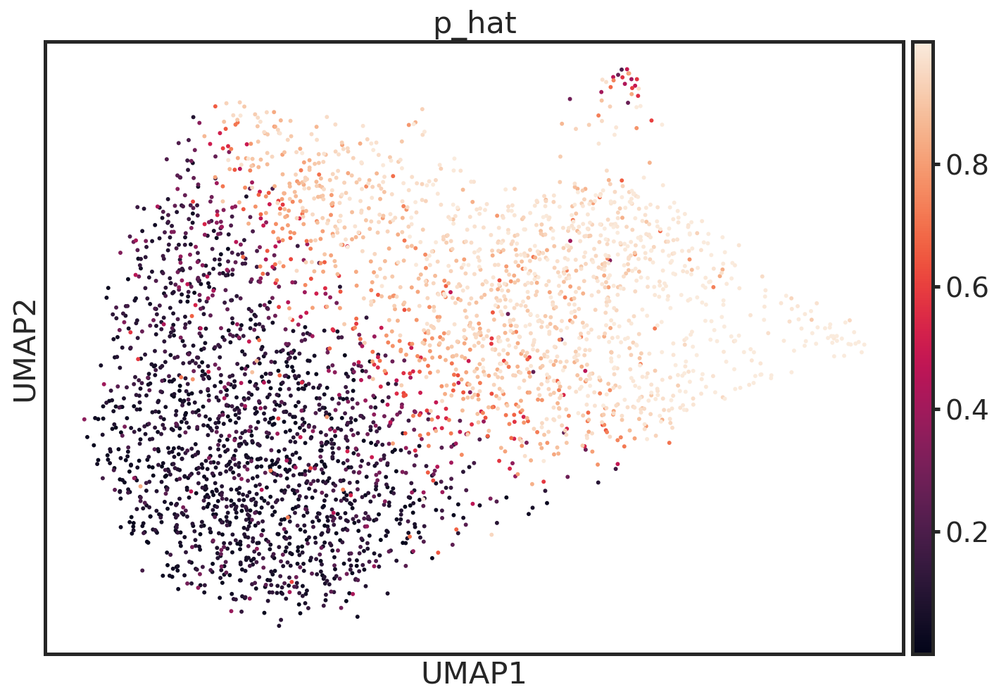

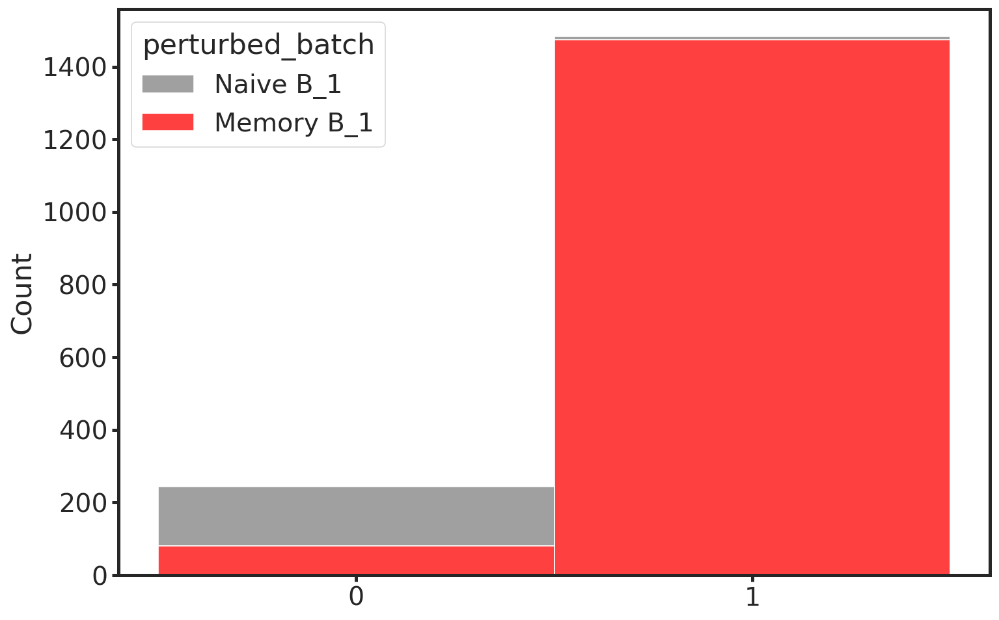

In [176]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=2, random_state=0).fit(pd.DataFrame(p_hat)[batch==1])#(df.drop(['batch', 'perturbed'], axis=1))
kmeans.labels_
#kmeans.cluster_centers_

df = pd.DataFrame()
df['batch'] = adata.obs['batch'].values.astype(int)
df['perturbed'] = adata.obs['perturbed'].values
df_kmeans = df[batch==1].copy()
df_kmeans['perturbed_batch'] = df_kmeans.apply(lambda row: f'{row["perturbed"]}_{row["batch"]}', axis=1)
df_kmeans['kmeans_labels'] = kmeans.labels_
#df_kmeans.head()
sns.histplot(x=kmeans.labels_.astype('str'), 
             hue='perturbed_batch', 
             palette=['gray', 'red'],#sns.color_palette('Dark2', 2), 
             multiple='stack', 
             data=df_kmeans)
plt.show()

In [177]:
kmeans.cluster_centers_
# can try a gaussian mixture too
# maybe LDA also?

array([[0.22663035],
       [0.9180321 ]])

<ipython-input-178-be6db1941019>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat['kmeans'][batch==1] = kmeans.labels_


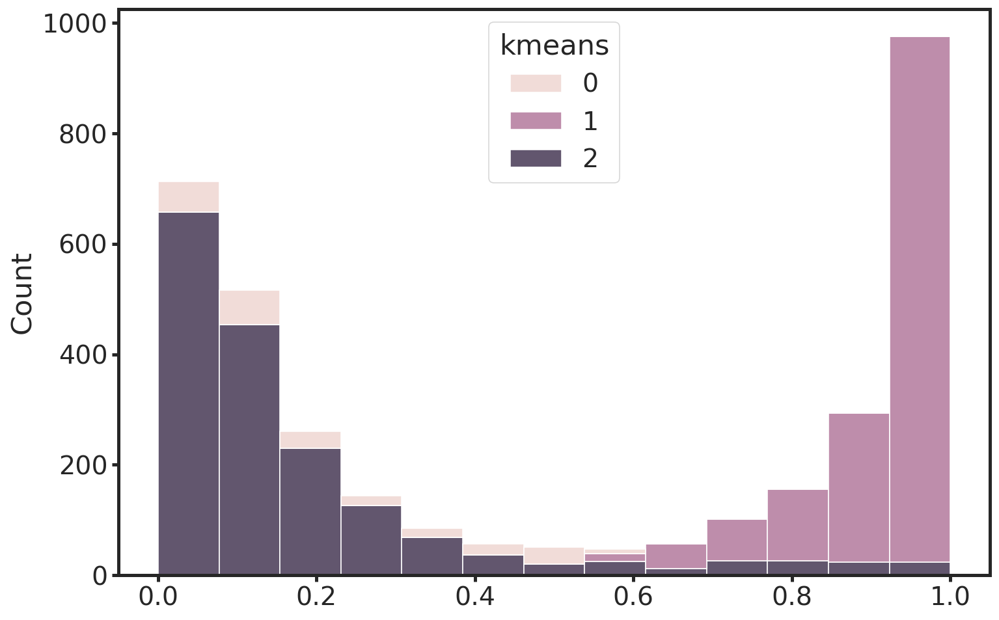

In [178]:
df_p_hat['kmeans'] = 2
df_p_hat['kmeans'][batch==1] = kmeans.labels_
sns.histplot(x=p_hat,
             hue='kmeans', 
             #palette={'Naive B':'gray','Memory B':'red'},
             data=df_p_hat,
             multiple='stack')
num_pcs = adata.obsm['X_pca'].shape[1]
#plt.title(f'Num PCs {num_pcs}')
plt.show()

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'kmeans_labels' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequenc

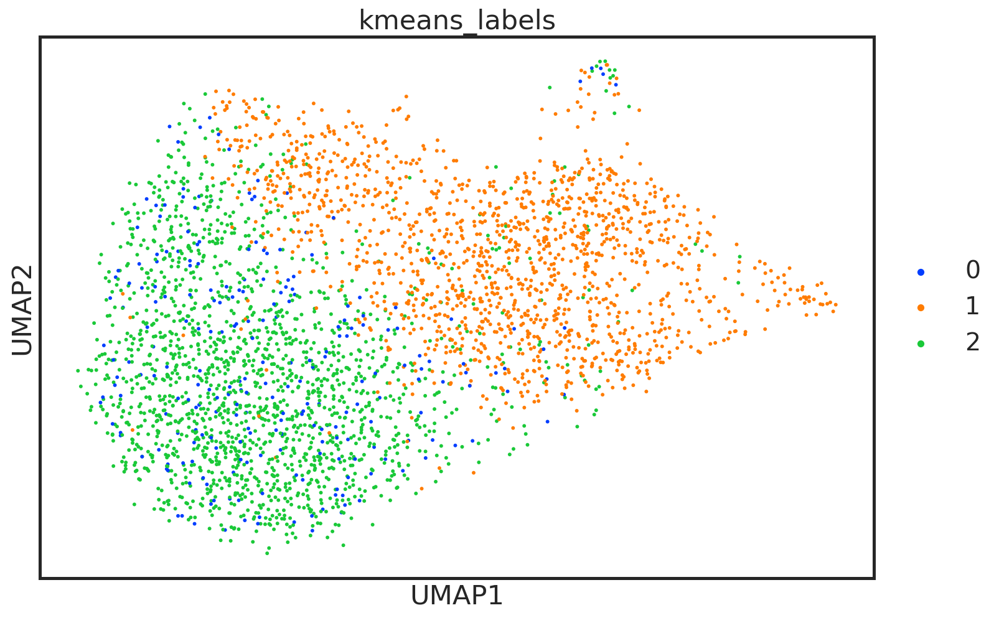

In [179]:
adata.obs['kmeans_labels'] = df_p_hat['kmeans'].values.astype('str')
sc.pl.umap(adata, color='kmeans_labels')

In [180]:
plt.scatter(tmp[batch==1], tmp[batch==1], c=kmeans.labels_==1, alpha=0.5)
# i want a two by two table, with perturbed/nnot perturbed, and kmeans label 0 and 1

IndexError: boolean index did not match indexed array along dimension 0; dimension is 2054 but corresponding boolean dimension is 3455

In [181]:
plt.scatter(tmp[batch==1], tmp[batch==1], c=perturbed[batch==1]=='Memory B', alpha=0.5)

IndexError: boolean index did not match indexed array along dimension 0; dimension is 2054 but corresponding boolean dimension is 3455